In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

%matplotlib inline

D:\ProgrammeFile\Anaconda\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


### Option 1: sliding window

In [3]:
SlidingOne = pd.read_csv('../data/sliding01.csv', sep=',', index_col=0)
SlidingOne.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,away-wins,away-draws,away-losses,away-goals,away-opposition-goals
0,A,1.36,4.75,8.50,7,1,2,26,12,3,6,1,11,6
1,D,2.40,3.30,2.90,2,3,5,9,14,5,2,3,17,12
2,D,3.20,3.30,2.25,4,2,4,11,13,7,2,1,19,8
3,H,1.75,3.75,4.33,4,1,5,14,16,4,1,5,13,12
4,D,1.40,4.33,8.00,5,3,2,21,11,2,3,5,14,20


In [4]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingOne.loc[:, categorical_cols] = SlidingOne[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingOne.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,away-wins,away-draws,away-losses,away-goals,away-opposition-goals
0,0,1.36,4.75,8.50,7,1,2,26,12,3,6,1,11,6
1,1,2.40,3.30,2.90,2,3,5,9,14,5,2,3,17,12
2,1,3.20,3.30,2.25,4,2,4,11,13,7,2,1,19,8
3,2,1.75,3.75,4.33,4,1,5,14,16,4,1,5,13,12
4,1,1.40,4.33,8.00,5,3,2,21,11,2,3,5,14,20


In [7]:
y= SlidingOne['result']

dfX = SlidingOne.loc[:, SlidingOne.columns != 'result']
X = dfX.to_numpy()

In [9]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [34]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 3294


In [35]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.64


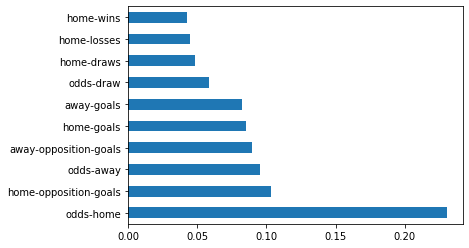

In [36]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.20573 to fit



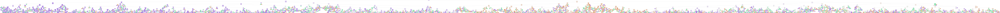

In [37]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Option 2

In [39]:
SlidingTwo = pd.read_csv('../data/sliding02_shots.csv', sep=',', index_col=0)
SlidingTwo.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,home-opposition_shots_on_target,away-wins,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-opposition_shots,away-opposition_shots_on_target
0,H,3.5,3.3,2.10,1,3,6,11,16,137,...,53,8,2,0,15,6,161,78,72,30
1,D,2.0,3.3,4.00,4,1,5,10,15,104,...,73,4,0,6,14,18,113,55,151,70
2,H,3.0,3.3,2.38,2,3,5,12,18,90,...,60,6,2,2,19,12,91,41,140,69
3,H,3.0,3.3,2.38,2,2,6,8,13,126,...,68,4,1,5,23,16,124,67,90,39
4,D,2.5,3.3,2.88,3,1,6,8,16,134,...,77,3,3,4,11,18,104,44,87,36


In [40]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingTwo.loc[:, categorical_cols] = SlidingTwo[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingTwo.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,home-opposition_shots_on_target,away-wins,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-opposition_shots,away-opposition_shots_on_target
0,2,3.5,3.3,2.10,1,3,6,11,16,137,...,53,8,2,0,15,6,161,78,72,30
1,1,2.0,3.3,4.00,4,1,5,10,15,104,...,73,4,0,6,14,18,113,55,151,70
2,2,3.0,3.3,2.38,2,3,5,12,18,90,...,60,6,2,2,19,12,91,41,140,69
3,2,3.0,3.3,2.38,2,2,6,8,13,126,...,68,4,1,5,23,16,124,67,90,39
4,1,2.5,3.3,2.88,3,1,6,8,16,134,...,77,3,3,4,11,18,104,44,87,36


In [47]:
y= SlidingTwo['result']

dfX = SlidingTwo.loc[:, SlidingTwo.columns != 'result']
X = dfX.to_numpy()

In [48]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [49]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 1184


In [50]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.74


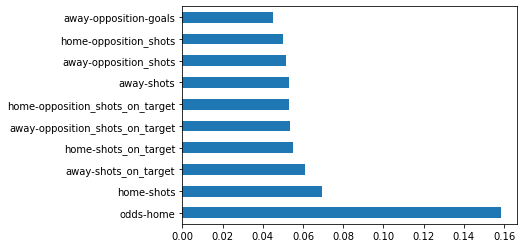

In [51]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.4082 to fit



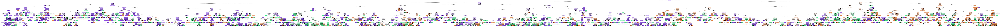

In [52]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Option 3

In [53]:
SlidingThree = pd.read_csv('../data/sliding03_shots_extra.csv', sep=',', index_col=0)
SlidingThree.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,away-opposition_shots,away-opposition_shots_on_target,home_shot_accuracy,home_shot_efficiency,home_opposition_shot_accuracy,home_opposition_shot_efficiency,away_shot_accuracy,away_shot_efficiency,away_opposition_shot_accuracy,away_opposition_shot_efficiency
0,H,3.5,3.3,2.10,1,3,6,11,16,137,...,72,30,0.489051,0.164179,0.452991,0.301887,0.484472,0.192308,0.416667,0.200000
1,D,2.0,3.3,4.00,4,1,5,10,15,104,...,151,70,0.480769,0.200000,0.477124,0.205479,0.486726,0.254545,0.463576,0.257143
2,H,3.0,3.3,2.38,2,3,5,12,18,90,...,140,69,0.466667,0.285714,0.428571,0.300000,0.450549,0.463415,0.492857,0.173913
3,H,3.0,3.3,2.38,2,2,6,8,13,126,...,90,39,0.484127,0.131148,0.475524,0.191176,0.540323,0.343284,0.433333,0.410256
4,D,2.5,3.3,2.88,3,1,6,8,16,134,...,87,36,0.477612,0.125000,0.509934,0.207792,0.423077,0.250000,0.413793,0.500000


In [54]:
# instantiate labelencoder object
le = LabelEncoder()

# apply le on categorical feature columns
categorical_cols = ['result']
SlidingThree.loc[:, categorical_cols] = SlidingThree[categorical_cols].apply(lambda col: le.fit_transform(col))

SlidingTwo.head()

,result,odds-home,odds-draw,odds-away,home-wins,home-draws,home-losses,home-goals,home-opposition-goals,home-shots,...,home-opposition_shots_on_target,away-wins,away-draws,away-losses,away-goals,away-opposition-goals,away-shots,away-shots_on_target,away-opposition_shots,away-opposition_shots_on_target
0,2,3.5,3.3,2.10,1,3,6,11,16,137,...,53,8,2,0,15,6,161,78,72,30
1,1,2.0,3.3,4.00,4,1,5,10,15,104,...,73,4,0,6,14,18,113,55,151,70
2,2,3.0,3.3,2.38,2,3,5,12,18,90,...,60,6,2,2,19,12,91,41,140,69
3,2,3.0,3.3,2.38,2,2,6,8,13,126,...,68,4,1,5,23,16,124,67,90,39
4,1,2.5,3.3,2.88,3,1,6,8,16,134,...,77,3,3,4,11,18,104,44,87,36


In [55]:
y= SlidingThree['result']

dfX = SlidingThree.loc[:, SlidingThree.columns != 'result']
X = dfX.to_numpy()

In [56]:
X_train, X_test, y_train, y_test = train_test_split(
         X, y, test_size=0.3, random_state=0,shuffle=False)

In [57]:
tree = DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=0)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
print('Misclassified samples: %d' % (y_test != y_pred).sum())

Misclassified samples: 1218


In [58]:
print('The accuracy is : %.2f' % tree.score(X, y))

The accuracy is : 0.75


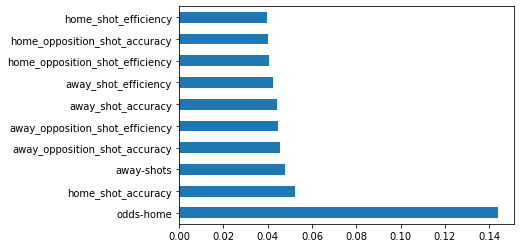

In [59]:

feat_importances = pd.Series(tree.feature_importances_, index=dfX.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

#### 6. Visualize the resulting tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.389161 to fit



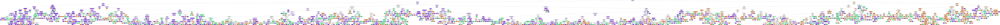

In [60]:
dot_data = StringIO()
export_graphviz(tree, 
                out_file=dot_data,
                feature_names=dfX.columns,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
